In [2]:
import numpy as np
import os

import scipy.stats

import matplotlib.pyplot as plt

(35242,)
(35336,)
(58325,)
(58169,)
(25043,)
(37351,)
(37084,)
(36265,)
(55026,)
(48309,)
(32256,)
(29577,)


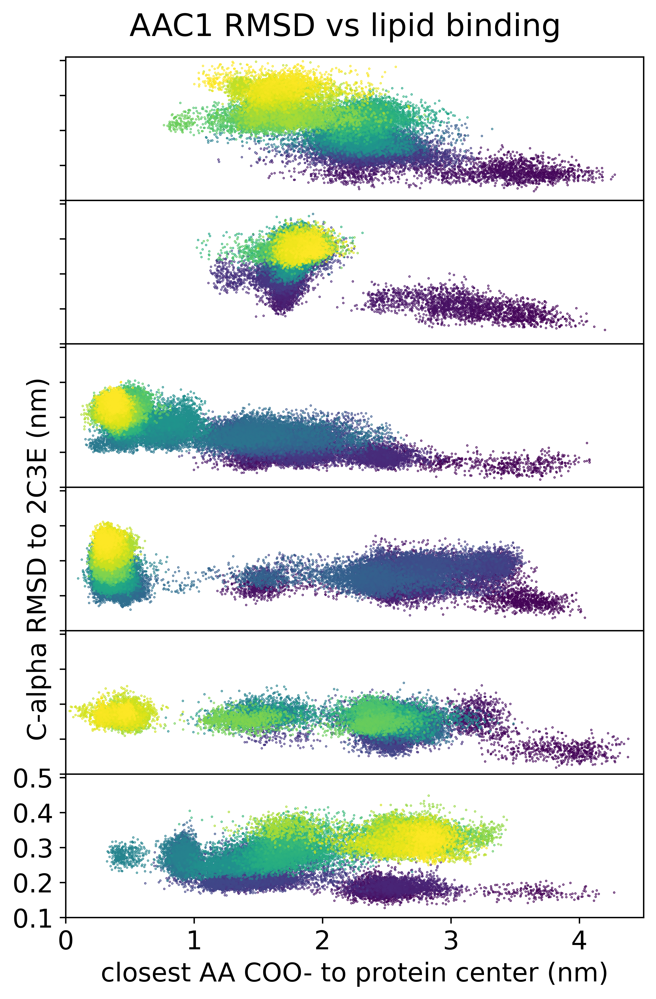

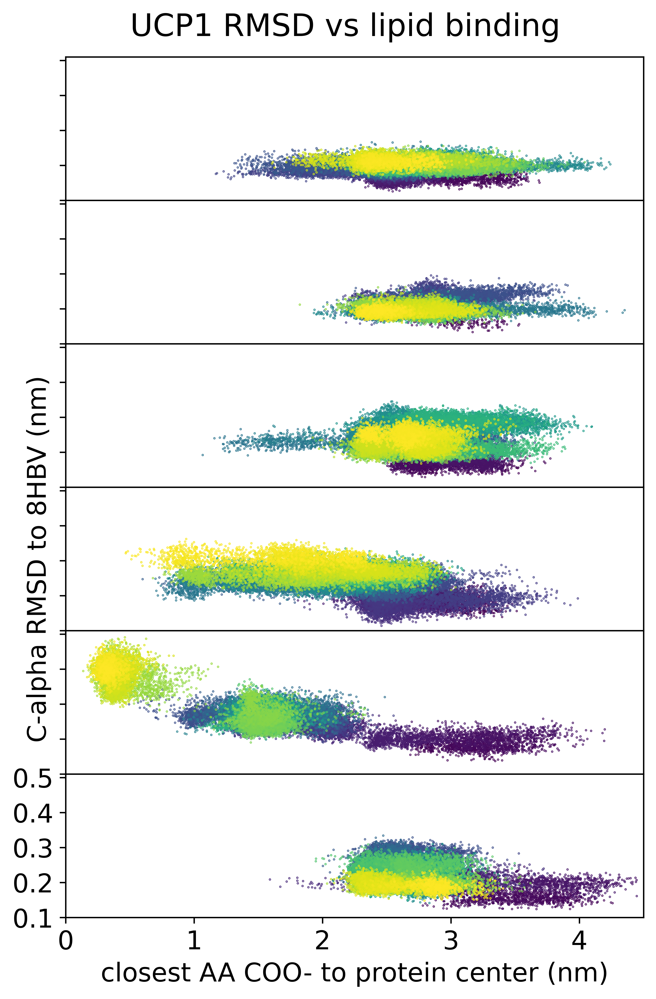

In [22]:
threshold = 0.33
window = 500

colors = ["C0", "C1", "C2", "C3", "C4", "grey"]
pdbids = {"aac1": "2C3E", "ucp1": "8HBV"}

def compile_rmsd(molecule, leaflet):

    inputpath = "/home/jonathan/Documents/grabelab/aac1-ucp1/long-aac1-ucp1/closest_approaches"
    inputpath_rmsd = "/home/jonathan/Documents/grabelab/aac1-ucp1/long-aac1-ucp1/rmsd_rmsf"

    servers = ["wynton", "degrabo"]
    proteins = ["aac1", "ucp1"]

    #loop over servers, proteins, and parallel runs
    for protein in proteins:

        fig = plt.figure(figsize = (6,9), dpi=600)
        gs = fig.add_gridspec(6, hspace=0) #-0.2 works otherwise
        axs = gs.subplots(sharex=True, sharey=True)

        ci = 0

        wire_fractions = []
        legend = []

        #plt.figure(figsize = (15,6), dpi=600)

        for server in servers:
            for run in range(1,5):
                if server == "degrabo" and run > 2:
                    continue

                #segments are named differently on different servers
                if server == "wynton":
                    segs = ["001"]+[str(i) for i in range(100, 1000, 100)]
                elif server == "degrabo":
                    segs = [str(i).zfill(3) for i in range(1,20)]
                else:
                    segs = [] #ensure variable is defined

                #step is in microseconds
                if server == "wynton" and (run == 3 or run == 4):
                    step = 1/10000
                else:
                    step = 1/5000

                fnbase = f"{inputpath}/{server}/{protein}/run0{run}/{protein}-{server}-run0{run}"
                if not os.path.exists(f"{fnbase}-initseg{segs[0]}-{molecule}-{leaflet}-resseqs.npy"):
                    print(f"no file found for {server} {protein} run{run}")
                    continue
                
                #print(server, protein, run, leaflet, residue)
                resseqs = list(np.load(f"{fnbase}-initseg{segs[0]}-{molecule}-{leaflet}-resseqs.npy"))
                #print(resseqs)
                #figure out which trajectory segment has the closest approach
                #min_dists_all = []
                #argmin_dists_all = []
                dists_all = []

                for seg in segs:
                    spath = f"{fnbase}-initseg{seg}-{molecule}-{leaflet}.npy"
                    if os.path.exists(spath):
                        dists = np.load(spath)
                        dists_all.append(dists)
                        #min_dists_all.append(np.min(dists, axis = 1))
                        #argmin_dists_all.append(np.argmin(dists, axis = 1))
                
                rmsd = []
                for seg in range(1,20):
                    file = f"{inputpath_rmsd}/{server}/{protein}/run0{run}/{protein}-{server}-run{str(run).zfill(2)}-seg{str(seg).zfill(2)}-rmsd.npy"
                    if os.path.exists(file):
                        rmsd.append(np.load(file))

                rmsd = np.concatenate(rmsd) 

                
                dists_all = np.concatenate(dists_all, axis = 1)
                mindists = np.min(dists_all, axis = 0)
                print(mindists.shape)

                #plt.figure(dpi=600)
                axs[ci].scatter(mindists, rmsd, s=0.1, c = [i*step for i in range(len(mindists))])
                
                axs[ci].set_yticks([0.1, 0.2, 0.3, 0.4, 0.5])
                if ci != 5:
                    axs[ci].tick_params(axis='y', labelleft=False)
                
                axs[ci].set_xlim(0,4.5)
                axs[ci].set_ylim(0.1,0.51)

                #plt.xlabel
                #plt.show()
                
                #print(min(dists))
                #smoothed_dists = [np.mean(mindists[i:i+window]) for i in range(len(mindists)-window)]

                #plt.plot([i*step for i in range(len(smoothed_dists))], smoothed_dists, linewidth = 1.5, color = colors[ci])

                #plt.plot([i*step for i in range(len(dists))], dists, linewidth = 0.5)
                #legend.append(f"run {ci+1}")
                #plt.show()
                ci += 1

        plt.xlabel("closest AA COO- to protein center (nm)")
        axs[3].set_ylabel(f"C-alpha RMSD to {pdbids[protein]} (nm)", va='center', labelpad=12)

        plt.suptitle(f"{protein.upper()} RMSD vs lipid binding", y = 0.92)
        #plt.savefig(f"{inputpath}/rmsd_vs_binding_{protein}.svg", bbox_inches='tight', format ='svg')
        plt.savefig(f"{inputpath}/rmsd_vs_binding_{protein}.png", bbox_inches='tight', format ='png', dpi = 400)


        #plt.axhline(0.33, 0, 8, color="black")

        # plt.rcParams.update({'font.size': 15})
        # # creating a dictionary
        # font = {'size': 15}
        # # using rc function
        # plt.rc('font', **font)

        # # plt.xlim(0,5)
        # # plt.ylim(0,0.5)
        # plt.legend(legend)
        # #plt.title(f"{protein} RMSD")
        # plt.xlabel("Time (µs)")
        # plt.ylabel(f"min AA distance to PDB {pdbids[protein]} (nm)")
 
        # # plt.savefig(f"{inputpath}/rmsd_{protein}.svg", bbox_inches='tight', format ='svg')

        # plt.show()

        #print(wire_fractions)
        #print(f"wire forms {np.round(np.mean(wire_fractions), 4)}+={np.round(np.std(wire_fractions), 4)} of the time")


compile_rmsd("ARAN", "upper")

/home/jonathan/Documents/grabelab/aac1-ucp1/long-aac1-ucp1/closest_approaches/wynton/aac1/run01/aac1-wynton-run01-initseg001-ARAN-upper.npy
/home/jonathan/Documents/grabelab/aac1-ucp1/long-aac1-ucp1/closest_approaches/wynton/aac1/run01/aac1-wynton-run01-initseg100-ARAN-upper.npy
/home/jonathan/Documents/grabelab/aac1-ucp1/long-aac1-ucp1/closest_approaches/wynton/aac1/run01/aac1-wynton-run01-initseg200-ARAN-upper.npy
/home/jonathan/Documents/grabelab/aac1-ucp1/long-aac1-ucp1/closest_approaches/wynton/aac1/run01/aac1-wynton-run01-initseg300-ARAN-upper.npy
(35242,)
/home/jonathan/Documents/grabelab/aac1-ucp1/long-aac1-ucp1/closest_approaches/wynton/aac1/run02/aac1-wynton-run02-initseg001-ARAN-upper.npy
/home/jonathan/Documents/grabelab/aac1-ucp1/long-aac1-ucp1/closest_approaches/wynton/aac1/run02/aac1-wynton-run02-initseg100-ARAN-upper.npy
/home/jonathan/Documents/grabelab/aac1-ucp1/long-aac1-ucp1/closest_approaches/wynton/aac1/run02/aac1-wynton-run02-initseg200-ARAN-upper.npy
/home/jonat

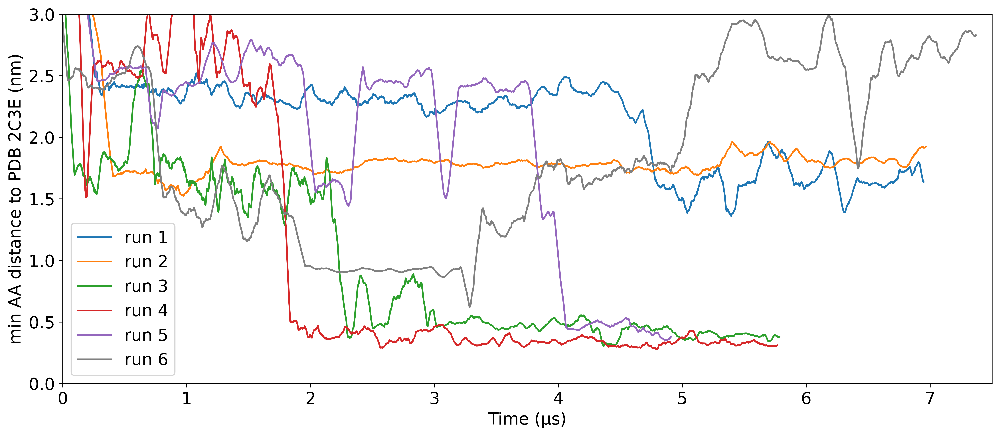

/home/jonathan/Documents/grabelab/aac1-ucp1/long-aac1-ucp1/closest_approaches/wynton/ucp1/run01/ucp1-wynton-run01-initseg001-ARAN-upper.npy
/home/jonathan/Documents/grabelab/aac1-ucp1/long-aac1-ucp1/closest_approaches/wynton/ucp1/run01/ucp1-wynton-run01-initseg100-ARAN-upper.npy
/home/jonathan/Documents/grabelab/aac1-ucp1/long-aac1-ucp1/closest_approaches/wynton/ucp1/run01/ucp1-wynton-run01-initseg200-ARAN-upper.npy
/home/jonathan/Documents/grabelab/aac1-ucp1/long-aac1-ucp1/closest_approaches/wynton/ucp1/run01/ucp1-wynton-run01-initseg300-ARAN-upper.npy
(37084,)
/home/jonathan/Documents/grabelab/aac1-ucp1/long-aac1-ucp1/closest_approaches/wynton/ucp1/run02/ucp1-wynton-run02-initseg001-ARAN-upper.npy
/home/jonathan/Documents/grabelab/aac1-ucp1/long-aac1-ucp1/closest_approaches/wynton/ucp1/run02/ucp1-wynton-run02-initseg100-ARAN-upper.npy
/home/jonathan/Documents/grabelab/aac1-ucp1/long-aac1-ucp1/closest_approaches/wynton/ucp1/run02/ucp1-wynton-run02-initseg200-ARAN-upper.npy
/home/jonat

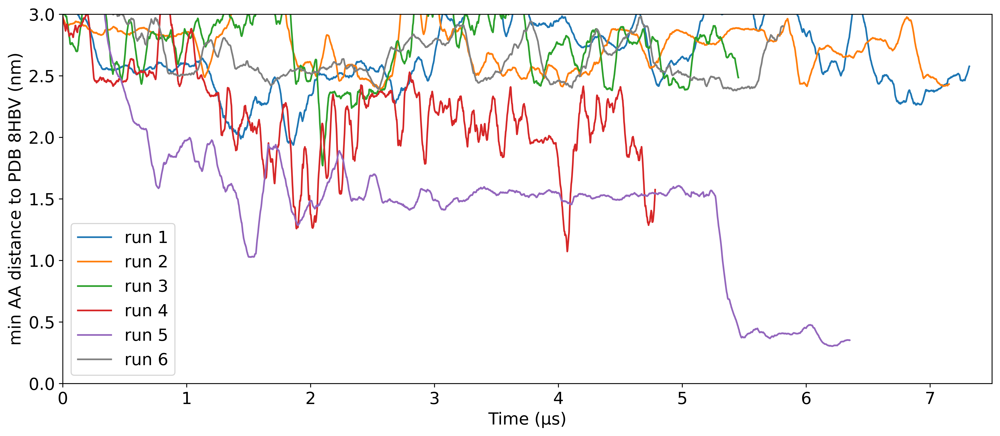

In [9]:
threshold = 0.33
window = 500

colors = ["C0", "C1", "C2", "C3", "C4", "grey"]
pdbids = {"aac1": "2C3E", "ucp1": "8HBV"}

def compile_rmsd(molecule, leaflet):

    inputpath = "/home/jonathan/Documents/grabelab/aac1-ucp1/long-aac1-ucp1/closest_approaches"

    servers = ["wynton", "degrabo"]
    proteins = ["aac1", "ucp1"]

    #loop over servers, proteins, and parallel runs
    for protein in proteins:

        ci = 0

        wire_fractions = []
        legend = []

        plt.figure(figsize = (15,6), dpi=600)

        for server in servers:
            for run in range(1,5):
                if server == "degrabo" and run > 2:
                    continue

                # #segments are named differently on different servers
                # if server == "wynton":
                #     segs = ["001"]+[str(i) for i in range(100, 1000, 100)]
                # elif server == "degrabo":
                #     segs = [str(i).zfill(3) for i in range(1,20)]
                # else:
                #     segs = [] #ensure variable is defined

                # #step is in microseconds
                # if server == "wynton" and (run == 3 or run == 4):
                #     step = 1/10000
                # else:
                #     step = 1/5000

                # fnbase = f"{inputpath}/{server}/{protein}/run0{run}/{protein}-{server}-run0{run}"
                # if not os.path.exists(f"{fnbase}-initseg{segs[0]}-{molecule}-{leaflet}-resseqs.npy"):
                #     print(f"no file found for {server} {protein} run{run}")
                #     continue
                
                # #print(server, protein, run, leaflet, residue)
                # resseqs = list(np.load(f"{fnbase}-initseg{segs[0]}-{molecule}-{leaflet}-resseqs.npy"))
                # #print(resseqs)
                # #figure out which trajectory segment has the closest approach
                # #min_dists_all = []
                # #argmin_dists_all = []
                # dists_all = []

                # for seg in segs:
                #     spath = f"{fnbase}-initseg{seg}-{molecule}-{leaflet}.npy"
                #     if os.path.exists(spath):
                #         dists = np.load(spath)
                #         dists_all.append(dists)
                #         #min_dists_all.append(np.min(dists, axis = 1))
                #         #argmin_dists_all.append(np.argmin(dists, axis = 1))
                        
               	# #for d in dists_all:
                # #    print(d.shape) 
                
                # dists_all = np.concatenate(dists_all, axis = 1)

                #step is in microseconds
                if server == "wynton" and (run == 3 or run == 4):
                    step = 1/10000
                else:
                    step = 1/5000

                dists_all = []
 
                for seg in range(0,20):

                    if server == "degrabo":
                        segstr = str(seg).zfill(3)
                    if server == "wynton":
                        if seg == 0:
                            segstr = "001"
                        else:
                            segstr = str(seg)+"00"

                    file = f"{inputpath}/{server}/{protein}/run0{run}/{protein}-{server}-run{str(run).zfill(2)}-initseg{segstr}-{molecule}-{leaflet}.npy"

                    if os.path.exists(file):
                        dists_all.append(np.load(file))
                        print(file)
                    # else:
                    #     break

                dists_all = np.concatenate(dists_all, axis = 1)
                mindists = np.min(dists_all, axis = 0)
                print(mindists.shape)

                #print(min(dists))
                smoothed_dists = [np.mean(mindists[i:i+window]) for i in range(len(mindists)-window)]

                plt.plot([i*step for i in range(len(smoothed_dists))], smoothed_dists, linewidth = 1.5, color = colors[ci])

                #plt.plot([i*step for i in range(len(dists))], dists, linewidth = 0.5)
                legend.append(f"run {ci+1}")
                #plt.show()
                ci += 1
                
        #plt.axhline(0.33, 0, 8, color="black")

        plt.rcParams.update({'font.size': 15})
        # creating a dictionary
        font = {'size': 15}
        # using rc function
        plt.rc('font', **font)

        plt.xlim(0,7.5)
        plt.ylim(0,3)
        plt.legend(legend)
        #plt.title(f"{protein} RMSD")
        plt.xlabel("Time (µs)")
        plt.ylabel(f"min AA distance to PDB {pdbids[protein]} (nm)")
 
        # plt.savefig(f"{inputpath}/rmsd_{protein}.svg", bbox_inches='tight', format ='svg')

        plt.show()

        #print(wire_fractions)
        #print(f"wire forms {np.round(np.mean(wire_fractions), 4)}+={np.round(np.std(wire_fractions), 4)} of the time")


compile_rmsd("ARAN", "upper")